In [1]:
import torch
import numpy as np
import logging
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor
from datasets import load_dataset
from tqdm import tqdm
import sys
import shap

# Set up logging
logging.basicConfig(
    level=logging.DEBUG,
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(sys.stdout),
        logging.FileHandler('evaluation.log')
    ]
)
logger = logging.getLogger(__name__)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
logger.info(f"Using device: {device}")

model_name = "facebook/wav2vec2-base-960h"
num_samples = 1  # Number of samples for SHAP background

/home/hagen/SHAP-Transformer-ASR/.shaptransformerasr/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-09-05 12:03:06.511378: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-05 12:03:06.523883: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757066586.538831   12625 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757066586.543047   12

2025-09-05 12:03:09,180 - INFO - Using device: cuda


In [2]:
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    
    def forward(self, x):
        # Ensure input has correct shape for the model
        if len(x.shape) == 4:
            x = x.squeeze(1).squeeze(1)  # Remove extra dimensions
        elif len(x.shape) == 3:
            x = x.squeeze(1)  # Remove extra dimension
        
        # Add attention mask
        attention_mask = torch.ones_like(x)
        
        # Forward pass with attention mask
        logits = self.model(x, attention_mask=attention_mask).logits
        
        # Log the shape and statistics of logits
        logger.info(f"Logits shape: {logits.shape}")
        logger.info(f"Logits mean: {torch.mean(logits).item():.6f}")
        logger.info(f"Logits std: {torch.std(logits).item():.6f}")
        
        # For SHAP, aggregate over vocab to get a scalar per time step
        return torch.max(logits, dim=-1).values # [batch, seq_len]

In [3]:
# Load model and processor
logger.info(f"Loading model: {model_name}")
processor = Wav2Vec2Processor.from_pretrained(model_name)
model = Wav2Vec2ForCTC.from_pretrained(model_name)
model = model.to(device)
logger.info("Model loaded successfully")

2025-09-05 12:03:09,236 - INFO - Loading model: facebook/wav2vec2-base-960h
2025-09-05 12:03:09,238 - DEBUG - Starting new HTTPS connection (1): huggingface.co:443
2025-09-05 12:03:09,400 - DEBUG - https://huggingface.co:443 "HEAD /facebook/wav2vec2-base-960h/resolve/main/preprocessor_config.json HTTP/1.1" 307 0
2025-09-05 12:03:09,415 - DEBUG - https://huggingface.co:443 "HEAD /api/resolve-cache/models/facebook/wav2vec2-base-960h/22aad52d435eb6dbaf354bdad9b0da84ce7d6156/preprocessor_config.json HTTP/1.1" 200 0
2025-09-05 12:03:09,547 - DEBUG - https://huggingface.co:443 "HEAD /facebook/wav2vec2-base-960h/resolve/main/tokenizer_config.json HTTP/1.1" 307 0
2025-09-05 12:03:09,561 - DEBUG - https://huggingface.co:443 "HEAD /api/resolve-cache/models/facebook/wav2vec2-base-960h/22aad52d435eb6dbaf354bdad9b0da84ce7d6156/tokenizer_config.json HTTP/1.1" 200 0
2025-09-05 12:03:09,691 - DEBUG - https://huggingface.co:443 "HEAD /facebook/wav2vec2-base-960h/resolve/main/processor_config.json HTTP/

Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


2025-09-05 12:03:10,965 - INFO - Model loaded successfully


In [4]:
# Create model wrapper for SHAP
wrapped_model = ModelWrapper(model)
logger.info("Model wrapper created")

2025-09-05 12:03:10,970 - INFO - Model wrapper created


In [5]:
def add_noise(audio: np.ndarray, snr_db: float) -> np.ndarray:
    """Add white noise to audio at specified SNR"""
    signal_power = np.mean(audio ** 2)
    noise_power = signal_power / (10 ** (snr_db / 10))
    noise = np.random.normal(0, np.sqrt(noise_power), len(audio))
    return audio + noise

In [6]:
logger.info(f"Creating test set with {num_samples} samples")
ds = load_dataset("patrickvonplaten/librispeech_asr_dummy", "clean", split="validation")
test_set = []

for i in tqdm(range(min(num_samples, len(ds))), desc="Creating test samples"):
    sample = ds[i]
    audio = sample["audio"]["array"]
    text = sample["text"]
    
    # Create clean sample
    test_set.append({
        "type": "clean",
        "audio": audio,
        "text": text,
        "snr": float('inf')
    })
    logger.info(f"Added clean sample {i+1}")
    
    # Create noisy samples with different SNRs [20, 10, 0, -5]
    for snr in tqdm([20,0], desc=f"Adding noise to sample {i+1}", leave=False):
        noisy_audio = add_noise(audio, snr)
        test_set.append({
            "type": "noisy",
            "audio": noisy_audio,
            "text": text,
            "snr": snr
        })
        logger.info(f"Added noisy sample {i+1} with SNR {snr}dB")

logger.info(f"Test set created with {len(test_set)} total samples")

2025-09-05 12:03:11,065 - INFO - Creating test set with 1 samples
2025-09-05 12:03:11,236 - DEBUG - https://huggingface.co:443 "HEAD /datasets/patrickvonplaten/librispeech_asr_dummy/resolve/main/README.md HTTP/1.1" 404 0
2025-09-05 12:03:11,368 - DEBUG - https://huggingface.co:443 "GET /api/datasets/patrickvonplaten/librispeech_asr_dummy HTTP/1.1" 200 1738
2025-09-05 12:03:11,370 - DEBUG - Starting new HTTPS connection (1): s3.amazonaws.com:443
2025-09-05 12:03:11,752 - DEBUG - https://s3.amazonaws.com:443 "HEAD /datasets.huggingface.co/datasets/datasets/patrickvonplaten/librispeech_asr_dummy/patrickvonplaten/librispeech_asr_dummy.py HTTP/1.1" 404 0
2025-09-05 12:03:11,753 - DEBUG - Starting new HTTPS connection (1): datasets-server.huggingface.co:443
2025-09-05 12:03:11,954 - DEBUG - https://datasets-server.huggingface.co:443 "GET /parquet?dataset=patrickvonplaten/librispeech_asr_dummy HTTP/1.1" 501 None
2025-09-05 12:03:12,078 - DEBUG - https://s3.amazonaws.com:443 "HEAD /datasets.hu

Creating test samples:   0%|                                                                      | 0/1 [00:00<?, ?it/s]

2025-09-05 12:03:12,795 - DEBUG - bytecode dump:
>          0	NOP(arg=None, lineno=1137)
           2	RESUME(arg=0, lineno=1137)
           4	LOAD_FAST(arg=0, lineno=1140)
           6	LOAD_CONST(arg=1, lineno=1140)
           8	BINARY_SUBSCR(arg=None, lineno=1140)
          18	STORE_FAST(arg=3, lineno=1140)
          20	LOAD_FAST(arg=1, lineno=1141)
          22	UNARY_NEGATIVE(arg=None, lineno=1141)
          24	LOAD_FAST(arg=3, lineno=1141)
          26	SWAP(arg=2, lineno=1141)
          28	COPY(arg=2, lineno=1141)
          30	COMPARE_OP(arg=1, lineno=1141)
          36	POP_JUMP_FORWARD_IF_FALSE(arg=6, lineno=1141)
          38	LOAD_FAST(arg=1, lineno=1141)
          40	COMPARE_OP(arg=1, lineno=1141)
          46	POP_JUMP_FORWARD_IF_FALSE(arg=5, lineno=1141)
          48	JUMP_FORWARD(arg=2, lineno=1141)
>         50	POP_TOP(arg=None, lineno=1141)
          52	JUMP_FORWARD(arg=2, lineno=1141)
>         54	LOAD_CONST(arg=1, lineno=1142)
          56	STORE_FAST(arg=3, lineno=1142)
>   

2025-09-05 12:03:13,626 - INFO - Added noisy sample 1 with SNR 20dB
2025-09-05 12:03:13,629 - INFO - Added noisy sample 1 with SNR 0dB


Creating test samples: 100%|██████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.14s/it]

2025-09-05 12:03:13,632 - INFO - Test set created with 3 total samples


In [7]:
logger.info("Computing SHAP values")
# Process audio
audio = test_set[0]["audio"]
inputs = processor(audio, sampling_rate=16000, return_tensors="pt")
input_values = inputs.input_values.to(device)

2025-09-05 12:03:13,680 - INFO - Computing SHAP values


In [8]:
# Create background samples with correct shape [batch_size, sequence_length]
num_background = 5
background = torch.zeros((num_background, input_values.shape[1]), device=device)
background += torch.randn_like(background) * 0.01  # Add small random noise
logger.info(f"Created background samples with shape {background.shape}")
logger.info(f"Background mean: {torch.mean(background).item():.6f}")
logger.info(f"Background std: {torch.std(background).item():.6f}")

2025-09-05 12:03:13,774 - INFO - Created background samples with shape torch.Size([5, 93680])
2025-09-05 12:03:13,792 - INFO - Background mean: -0.000004
2025-09-05 12:03:13,794 - INFO - Background std: 0.010005


In [9]:
# Initialize GradientExplainer with the model only
explainer = shap.GradientExplainer(
    wrapped_model,
    background,
    batch_size=1
)

2025-09-05 12:03:14,329 - INFO - Logits shape: torch.Size([5, 292, 32])
2025-09-05 12:03:14,330 - INFO - Logits mean: -2.916964
2025-09-05 12:03:14,332 - INFO - Logits std: 5.431002


In [10]:
# Log model output before SHAP computation
with torch.no_grad():
    model_output = wrapped_model(input_values)
    logger.info(f"Model output shape: {model_output.shape}")
    logger.info(f"Model output mean: {torch.mean(model_output).item():.6f}")
    logger.info(f"Model output std: {torch.std(model_output).item():.6f}")
    logger.info(f"Model output sum: {torch.sum(model_output).item():.6f}")

2025-09-05 12:03:14,374 - INFO - Logits shape: torch.Size([1, 292, 32])
2025-09-05 12:03:14,375 - INFO - Logits mean: -4.860755
2025-09-05 12:03:14,375 - INFO - Logits std: 8.078159
2025-09-05 12:03:14,376 - INFO - Model output shape: torch.Size([1, 292])
2025-09-05 12:03:14,376 - INFO - Model output mean: 14.872911
2025-09-05 12:03:14,377 - INFO - Model output std: 1.215157
2025-09-05 12:03:14,390 - INFO - Model output sum: 4342.890137


In [11]:
# Get SHAP values
logger.info("Computing SHAP values with GradientExplainer")
shap_values = explainer.shap_values(input_values)
logger.info(f"Raw SHAP values type: {type(shap_values)}")

2025-09-05 12:03:14,396 - INFO - Computing SHAP values with GradientExplainer
2025-09-05 12:03:14,595 - INFO - Logits shape: torch.Size([1, 292, 32])
2025-09-05 12:03:14,596 - INFO - Logits mean: -4.874137
2025-09-05 12:03:14,596 - INFO - Logits std: 8.101643
2025-09-05 12:03:14,665 - INFO - Logits shape: torch.Size([1, 292, 32])
2025-09-05 12:03:14,666 - INFO - Logits mean: -4.854486
2025-09-05 12:03:14,666 - INFO - Logits std: 8.089581
2025-09-05 12:03:14,687 - INFO - Logits shape: torch.Size([1, 292, 32])
2025-09-05 12:03:14,688 - INFO - Logits mean: -4.780303
2025-09-05 12:03:14,688 - INFO - Logits std: 7.993843
2025-09-05 12:03:14,709 - INFO - Logits shape: torch.Size([1, 292, 32])
2025-09-05 12:03:14,711 - INFO - Logits mean: -4.785577
2025-09-05 12:03:14,711 - INFO - Logits std: 7.980767
2025-09-05 12:03:14,733 - INFO - Logits shape: torch.Size([1, 292, 32])
2025-09-05 12:03:14,734 - INFO - Logits mean: -4.805170
2025-09-05 12:03:14,734 - INFO - Logits std: 8.011944
2025-09-05 1

In [12]:
wrapped_model.forward(input_values).shape

2025-09-05 12:30:28,242 - INFO - Logits shape: torch.Size([1, 292, 32])
2025-09-05 12:30:28,243 - INFO - Logits mean: -4.860755
2025-09-05 12:30:28,244 - INFO - Logits std: 8.078159


torch.Size([1, 292])

In [19]:
# retrieve logits
logits = model(input_values).logits

# take argmax and decode
predicted_ids = torch.argmax(logits, dim=-1)
transcription = processor.batch_decode(predicted_ids)

In [23]:
print(predicted_ids)
print(transcription)

tensor([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 17, 17,  0, 10, 12, 12,  0,  6,
          0,  5,  0, 13,  4,  4,  0, 30,  0, 16,  0,  0, 10, 15, 15,  0,  0,  6,
          0,  0,  0,  5, 13, 13,  0,  4,  4,  4,  0,  0, 10, 12, 12,  4,  4,  4,
          6, 11,  5,  5,  4,  4,  0,  0,  7,  0,  0,  0, 23,  0,  0,  0,  0,  0,
          8, 12, 12,  0,  0,  6,  6,  0, 15, 15, 15,  5,  5,  4,  4,  4,  4,  0,
          0,  8, 20,  0,  4,  4,  4,  6, 11,  5,  4,  4, 17, 17, 10, 14,  0,  0,
         14, 15, 15,  5,  5,  4,  4, 19,  0,  0, 15,  0,  0,  0,  0,  0,  7, 12,
          0,  0,  0, 12,  0,  0,  0,  0,  5,  0, 12, 12,  4,  4,  4,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  7,  9, 14, 14,  4,  4, 18,  0,  0,  5,  0,  4,
          0,  7, 13,  5,  5,  4,  4, 21,  0, 15,  0,  0,  0,  0,  0,  7,  0,  0,
          0, 14,  0,  4,  4,  4,  0,  6,  0,  8,  8,  4,  4,  0, 18,  0,  0,  5,
          0, 15,  0,  0,  0,

In [22]:
vocab = {"<pad>": 0, "<s>": 1, "</s>": 2, "<unk>": 3, "|": 4, "E": 5, "T": 6, "A": 7, "O": 8, "N": 9, "I": 10, "H": 11, "S": 12, "R": 13, "D": 14, "L": 15, "U": 16, "M": 17, "W": 18, "C": 19, "F": 20, "G": 21, "Y": 22, "P": 23, "B": 24, "V": 25, "K": 26, "'": 27, "X": 28, "J": 29, "Q": 30, "Z": 31}
output_string = ''.join([list(vocab.keys())[list(vocab.values()).index(id.item())] for id in predicted_ids[0]])
print(output_string)

<pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad>MM<pad>ISS<pad>T<pad>E<pad>R||<pad>Q<pad>U<pad><pad>ILL<pad><pad>T<pad><pad><pad>ERR<pad>|||<pad><pad>ISS|||THEE||<pad><pad>A<pad><pad><pad>P<pad><pad><pad><pad><pad>OSS<pad><pad>TT<pad>LLLEE||||<pad><pad>OF<pad>|||THE||MMID<pad><pad>DLLEE||C<pad><pad>L<pad><pad><pad><pad><pad>AS<pad><pad><pad>S<pad><pad><pad><pad>E<pad>SS|||<pad><pad><pad><pad><pad><pad><pad><pad><pad>ANDD||W<pad><pad>E<pad>|<pad>AREE||G<pad>L<pad><pad><pad><pad><pad>A<pad><pad><pad>D<pad>|||<pad>T<pad>OO||<pad>W<pad><pad>E<pad>L<pad><pad><pad>C<pad><pad>O<pad>MEE||||<pad>H<pad><pad>ISS<pad>|||<pad>G<pad><pad><pad><pad><pad>OOSS<pad><pad><pad>P<pad><pad><pad>EE<pad>LL<pad>||||<pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad><pad>


In [16]:
# Convert to numpy and process
if isinstance(shap_values[0], torch.Tensor):
    shap_values = [v.cpu().numpy() for v in shap_values]

In [17]:
# Convert to numpy array and handle shapes
shap_values = np.array(shap_values)  # Shape: (1, batch, seq_len)
logger.info(f"SHAP values shape after conversion: {shap_values.shape}")

2025-09-05 13:33:55,371 - INFO - SHAP values shape after conversion: (1, 93680, 292)


In [33]:
def plot_spectrograms(S_original, S_amplified, sr):
    """
    Visualizes the original and amplified mel spectrograms side by side.
    """
    # Convert power spectrograms to decibels (dB) for better visualization
    S_db_original = librosa.power_to_db(S_original, ref=np.max)
    S_db_amplified = librosa.power_to_db(S_amplified, ref=np.max)

    # Create figure
    fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(12, 8))
    fig.suptitle('Mel Spectrogram Comparison', fontsize=16)

    # Plot original spectrogram
    img1 = librosa.display.specshow(S_db_original, sr=sr, x_axis='time', y_axis='mel', ax=ax[0])
    ax[0].set(title='Original Spectrogram')
    ax[0].label_outer() # Hide x-axis label for the top plot
    fig.colorbar(img1, ax=ax[0], format='%+2.0f dB')

    # Plot amplified spectrogram
    img2 = librosa.display.specshow(S_db_amplified, sr=sr, x_axis='time', y_axis='mel', ax=ax[1])
    ax[1].set(title='Spectrogram with Amplified Quiet Sections')
    fig.colorbar(img2, ax=ax[1], format='%+2.0f dB')

    # Adjust layout and display the plot
    plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust for suptitle
    plt.show()

2025-09-05 16:40:32,019 - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x7be8ad568550>
2025-09-05 16:40:32,030 - DEBUG - locator: <matplotlib.ticker.AutoLocator object at 0x7be89c368f90>


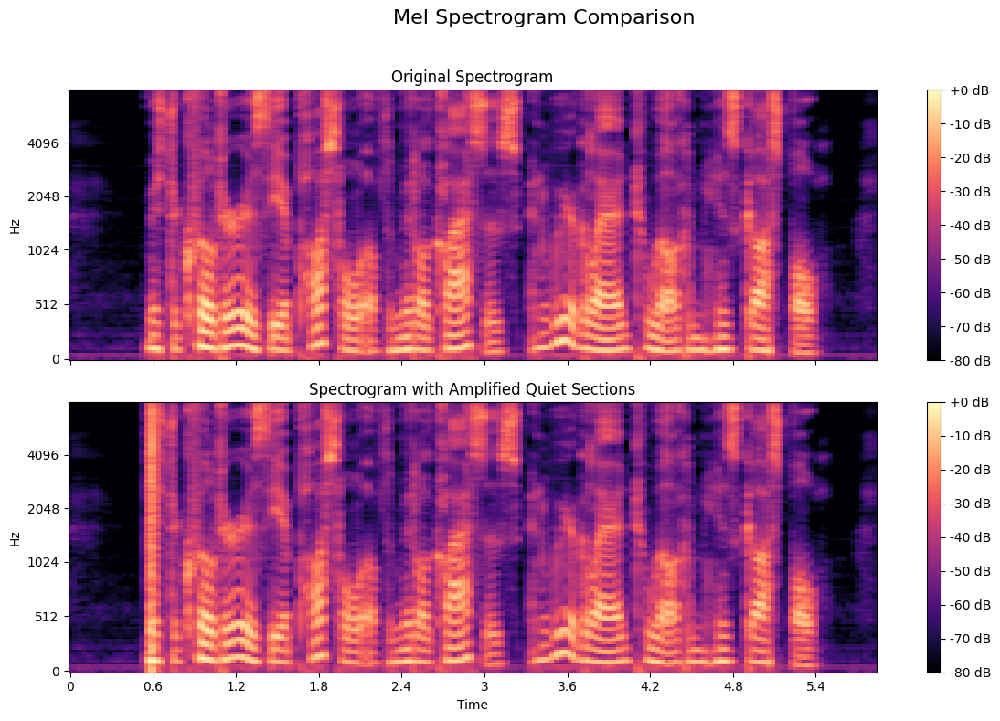

In [57]:
import librosa
import matplotlib.pyplot as plt
import soundfile as sf
m_shap_values = np.zeros((93680,))
for i, timestep in enumerate(shap_values[0]):
    m_shap_values[i] = (timestep[29] if timestep[29]>2 else 0.4)

norm_m_shap_values = (m_shap_values) / (m_shap_values.max())
#print(norm_m_shap_values.shape)
amplified_m_audio = audio * norm_m_shap_values
S_amplified_m_audio = librosa.feature.melspectrogram(y=amplified_m_audio, sr=16000, n_fft=2048, hop_length=512)
S_audio = librosa.feature.melspectrogram(y=audio, sr=16000, n_fft=2048, hop_length=512)
sf.write("m_amplified_audio.wav", amplified_m_audio, 16000)
plot_spectrograms(S_audio, S_amplified_m_audio, sr=16000)

In [18]:
print(np.argmax(shap_values[0][5]))

284
